HRRR TABLE: https://home.chpc.utah.edu/~u0553130/Brian_Blaylock/HRRR_archive/hrrr_sfc_table_f00-f01.html 

VIL and Hail: https://www.weather.gov/ohx/vildensityhailsize

# Preliminary Thoughts



Worked on by Myles, Jonathan, and Manuel.

- What are you thinking of focusing on?

    We're planning on focusing on hail damage and the assessment of hail severity. Specifically, we're looking to quantify atmospheric variables that are conducive to widespread and significant hail. 
  
  
- What makes this hazard or application interesting to explore?

    It is important to understand and quantify hail effects in order to protect life and property. As severe storm season continues to loom over us, it is vital to better understand and predict the factors that are conducive to causing widespread, dangerous hail outbreaks. Hail is particularly interesting because of both the mesoscale and synoptic factors that lead to its formation. 
  
  
- Why might it be useful to quantify threat or impact in this area?

    As we enter severe storm season, hail is a particularly damaging threat that we continue to improve our quantitative and qualitative understanding of. Specifically in this area, we saw widespread hail already this season. Understanding the quantitative properties of the atmosphere that led to this hail, through this index, will hopefully help meteorologists keep the public more informed and prepared for future severe weather outbreaks that may contain hail. 

# Downloading Relevant Model Data

In [2]:
#Code for downloading relevant model data worked on by Manuel

# Downloading the necessary modules to download, extract, and plot data from the model run
from herbie import Herbie, FastHerbie
from herbie.toolbox import EasyMap, pc
from herbie import paint
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime, timedelta, time, timezone
import pandas as pd, numpy as np
import xarray as xr
import dask


# Setting the run time to extract the data from a specific model run
run = pd.Timestamp("2026-03-10-12")
run

# Utilizing Herbie to find the HRRR run and extract 48 hours of data from it
H = FastHerbie([run], model="hrrr", product="sfc", fxx=np.arange(0,49,1).tolist(), save_dir='./data/', overwrite=True)

# Selecting the data products to extract from the run
ss = r"(CAPE:255-0 mb above ground|REFC:entire atmosphere|VIL:entire atmosphere|DZDT:0.5-0.8|RETOP:cloud top)"

# Downloading the selected variables
filepath = H.download(ss)

# Opening the dataset containing these selected variables in Xarray
ds = xr.open_mfdataset(filepath, combine='nested', concat_dim='valid_time')

# Sorting the dataset by time
ds = ds.sortby('valid_time')

# Selecting the geographical area of interest, so that maps are centered on areas with high hail concentration
ds_sub = ds.sel(y=slice(100,750), x=slice(600,1550))

# Converting into a NetCDF file, allowing us to work with the data
fname = f'hrrr_{run:%Y%m%d%H}.nc'
ds_sub.to_netcdf(fname)

# Opening the NetCDF file
ds_file = xr.open_dataset("hrrr_2026031012.nc") # ds_file used to open the netcdf file in order for us to use the data to create plots
ds_file



/usr/local/anaconda3/envs/custom_envs/meteo473_sp26/lib/python3.13/site-packages/herbie/core.py:978: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  logic = df.search_this.str.contains(search)
/usr/local/anaconda3/envs/custom_envs/meteo473_sp26/lib/python3.13/site-packages/herbie/core.py:978: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  logic = df.search_this.str.contains(search)
/usr/local/anaconda3/envs/custom_envs/meteo473_sp26/lib/python3.13/site-packages/herbie/core.py:978: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  logic = df.search_this.str.contains(search)
/usr/local/anaconda3/envs/custom_envs/meteo473_sp26/lib/python3.13/site-packages/herbie/core.py:978: UserWarning: This pattern is interpreted as a regular expre

<xarray.Dataset> Size: 615MB
Dimensions:                  (valid_time: 49, y: 650, x: 950)
Coordinates:
  * valid_time               (valid_time) datetime64[ns] 392B 2026-03-10T12:0...
    time                     datetime64[ns] 8B ...
    step                     (valid_time) timedelta64[ns] 392B ...
    atmosphere               float64 8B ...
    latitude                 (y, x) float64 5MB ...
    longitude                (y, x) float64 5MB ...
    cloudTop                 float64 8B ...
    sigmaLayer               float64 8B ...
    pressureFromGroundLayer  float64 8B ...
Dimensions without coordinates: y, x
Data variables:
    refc                     (valid_time, y, x) float32 121MB ...
    unknown                  (valid_time, y, x) float32 121MB ...
    veril                    (valid_time, y, x) float32 121MB ...
    wz                       (valid_time, y, x) float32 121MB ...
    cape                     (valid_time, y, x) float32 121MB ...
Attributes:
    GRIB_edition:            2
    GRIB_centre:             kwbc
    GRIB_centreDescription:  US National Weather Service - NCEP
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             US National Weather Service - NCEP
    history:                 2026-03-27T21:28 GRIB to CDM+CF via cfgrib-0.9.1...

# Ground Truth Observations

In [3]:
#Ground Truth Observations of the event worked on by Manuel

Our chosen hazard is hail. The first image is a reflectivity loop of the area with the largest hail of the day, where storms with high dBZ values are present. The second image displays the SPC storm reports for the day, indicating where hail was present across the region of interest—the third image of radar-derived hail swaths is in the area with the most hail. 
 
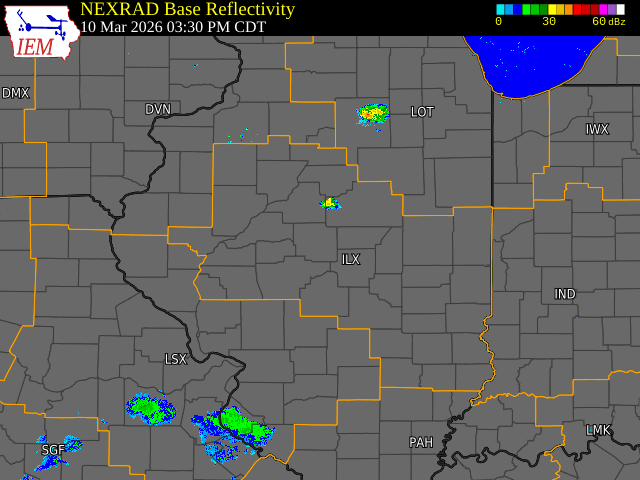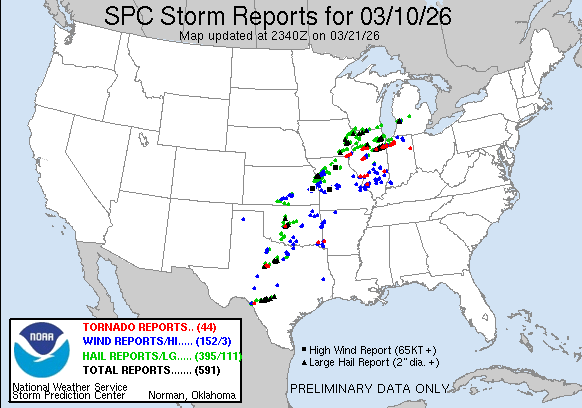 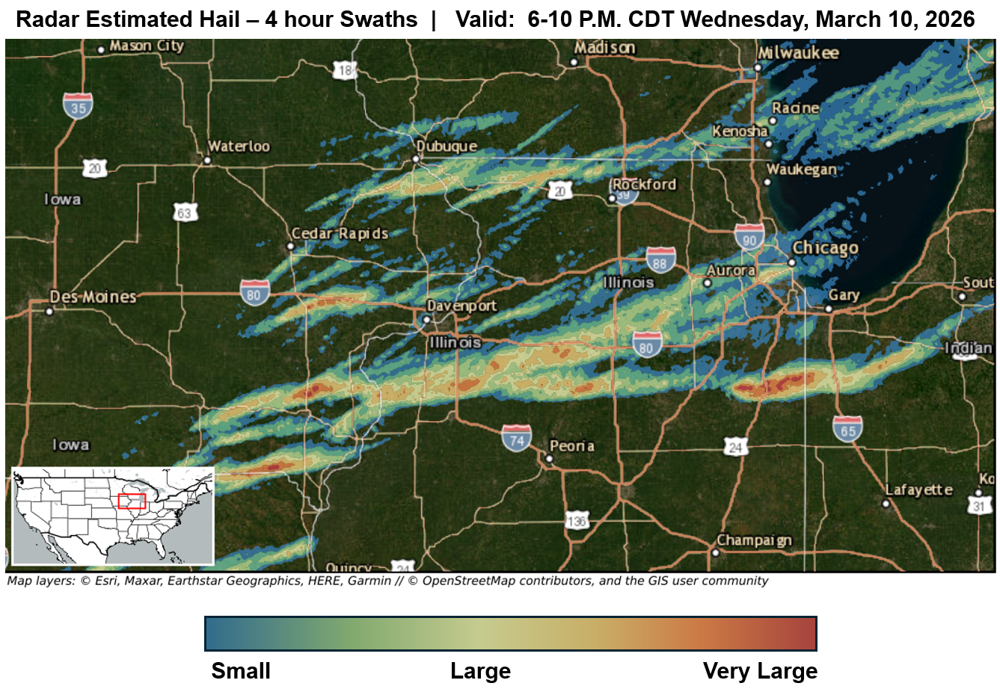 

# 4 Initial Plots

sh: 1: getfattr: not found


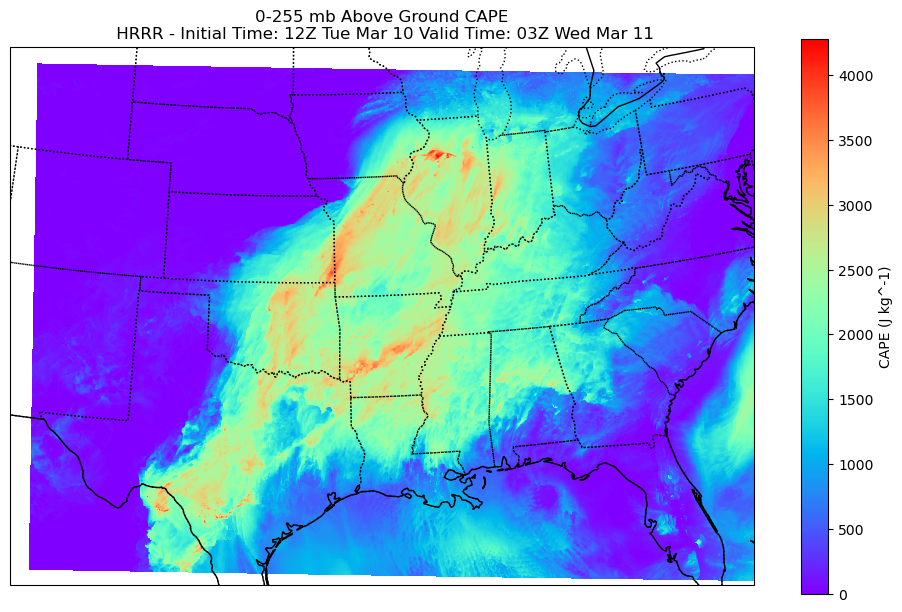

In [4]:
from herbie import Herbie, FastHerbie
from herbie.toolbox import EasyMap, pc
from herbie import paint
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime, timedelta, time, timezone
import pandas as pd, numpy as np
import xarray as xr
import dask
#Plot 1: CAPE: 255-0 mb above ground worked on by Myles
ds_file = xr.open_dataset("hrrr_2026031012.nc") #ds_file used to open the netcdf file in order for us to use the data to create plots
ds_file


#Plotting CAPE: 255-0 mb above ground

def map(): #map function used to create our base maps when needed
    fig = plt.figure(figsize=(12,9)) #figure size for us to place our base map
    ax = fig.add_subplot(111, projection=ccrs.LambertConformal()) #projection used for our base map
    ax.set_extent([-107,-79,26,44], ccrs.PlateCarree()) #set extent for our base map to zoom into our area of interest
    ax.add_feature(cfeature.COASTLINE) #coastlines added on our map 
    ax.add_feature(cfeature.STATES, linestyle=':')
    ax.add_feature(cfeature.BORDERS)
    return fig, ax

lon = ds_file['longitude'] #getting the longitude from our ds_file so we can plot our data
lat = ds_file['latitude'] #gettting the latitude from our ds_file so we can plot our data
dataproj = ccrs.PlateCarree() #making PlateCarree in our dataproj so we can add it to our pcolormesh
cape_5hr_rolling = ds_file["cape"].rolling(valid_time=5).max() #creating a cape_5hr_rolling so we can see the max amount of cape over a 5 hour period. 
refc_5hr_rolling = ds_file["refc"].rolling(valid_time=5).max() #creating a composite reflectivity so we can see the max amount of composite reflectivity over a 5 hour period. 

fig, ax = map() #printing out the base map funtion we created above
pcolor = ax.pcolormesh(lon, lat, cape_5hr_rolling.isel(valid_time=15), cmap = 'rainbow', transform = dataproj) #creating the pcolor mesh with the valid_time of 15 with the color map of rainbow and adding longitude and latitude.
plt.colorbar(pcolor, ax=ax, label = 'CAPE (J kg^-1)', shrink = 0.8) #creating a colorbar for our map and shrinking it to a respectable size
ax.set_title(f"0-255 mb Above Ground CAPE\n HRRR - Initial Time: {pd.to_datetime(ds_file['valid_time'].isel(valid_time=0).values):%HZ %a %b %d} Valid Time: {pd.to_datetime(ds_file['valid_time'].isel(valid_time=15).values):%HZ %a %b %d}") #setting our title with the model type, initial time, valid time, and what it is plotting
plt.show() #plotting our map

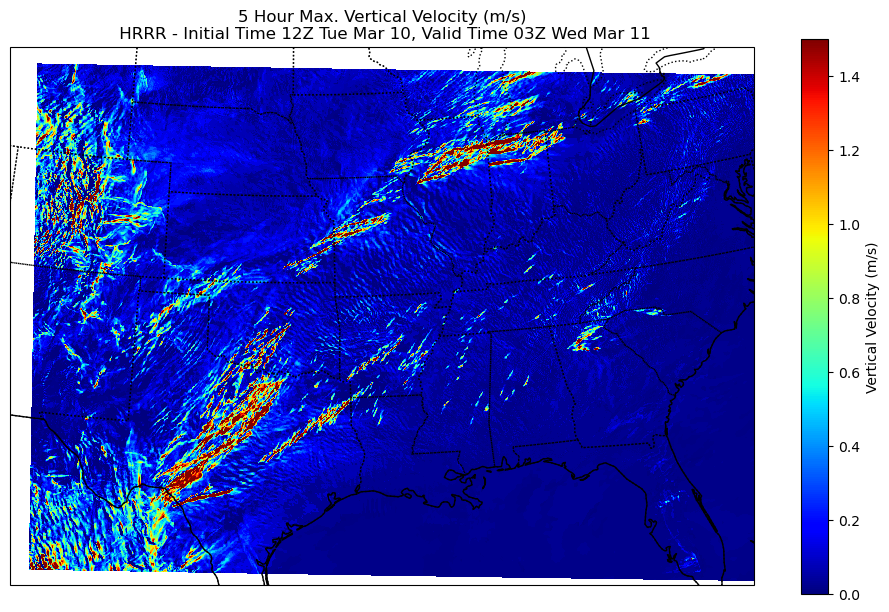

In [5]:
#Plot 2: Vertical Velocity worked on by Jonathan

wz_5hr_rolling = ds_file["wz"].rolling(valid_time=5).max() #Extracting the 5-hour max vertical velocity from the data file so it can be plotted

fig,ax=map() # Calling and printing the base map function created above

# Creating a colormesh plot of 5-hour max vertical velocity plotted on longitude and latitude, valid at 03Z
vert_velocity = ax.pcolormesh(ds_file.longitude, ds_file.latitude, wz_5hr_rolling.isel(valid_time=15), cmap = 'jet', vmin = 0, vmax = 1.5, transform=ccrs.PlateCarree())

cbar = plt.colorbar(vert_velocity, ax=ax, orientation='vertical', pad=0.05, shrink=0.8) # Creating a vertically oriented colorbar of 5-hour max vertical velocity
cbar.set_label('Vertical Velocity (m/s)') # Labeling colorbar with title and units

# Creating title containing information about content, initial time, and valid time of the plot
plt.title(f'5 Hour Max. Vertical Velocity (m/s)\n HRRR - Initial Time {pd.to_datetime(ds_file['valid_time'].isel(valid_time=0).values):%HZ %a %b %d}, Valid Time {pd.to_datetime(ds_file['valid_time'].isel(valid_time=15).values):%HZ %a %b %d}')


plt.show() # Display the map

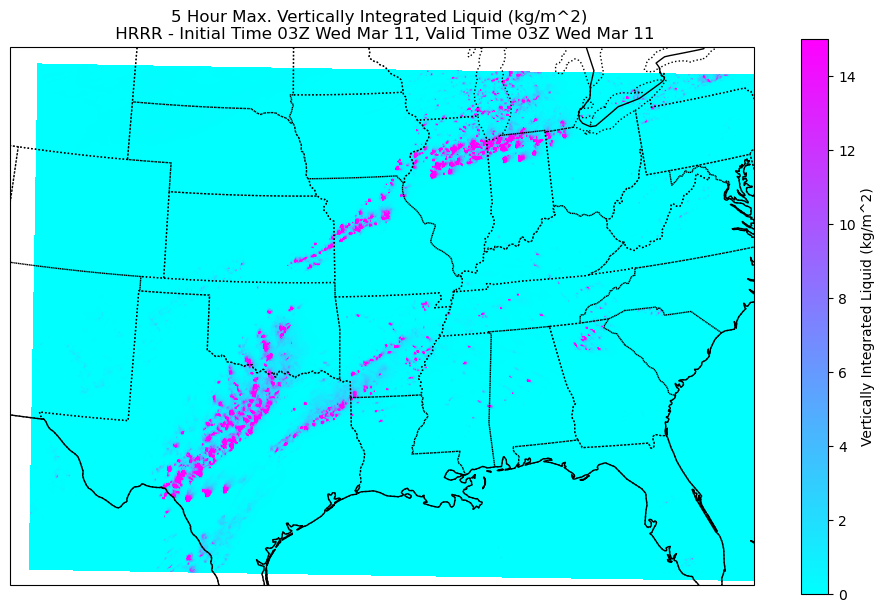

In [6]:
#Plot 3: Vertically Integrated Liquid worked on by Jonathan

veril_5hr_rolling = ds_file["veril"].rolling(valid_time=5).max() # Extracting the 5-hour max vertically integrated liquid from the data file so it can be plotted

fig,ax=map() #Calling and printing the base map function created above

# Creating a colormesh plot of 5-hour max vertically integrated liquid plotted on longitude and latitude, valid at 03Z
vert_int_liquid = ax.pcolormesh(ds_file.longitude, ds_file.latitude, veril_5hr_rolling.isel(valid_time=15), cmap = 'cool', vmin = 0, vmax = 15, transform=ccrs.PlateCarree())


cbar = plt.colorbar(vert_int_liquid, ax=ax, orientation='vertical', pad=0.05, shrink=0.8) # Creating a vertically oriented colorbar of 5-hour max vertically integrated liquid
cbar.set_label('Vertically Integrated Liquid (kg/m^2)') # Labeling colorbar with title and units

# Creating title containing information about content, initial time, and valid time of the plot
plt.title(f'5 Hour Max. Vertically Integrated Liquid (kg/m^2) \n HRRR - Initial Time {pd.to_datetime(ds_file['valid_time'].isel(valid_time=15).values):%HZ %a %b %d}, Valid Time {pd.to_datetime(ds_file['valid_time'].isel(valid_time=15).values):%HZ %a %b %d}')

# Display the map
plt.show()

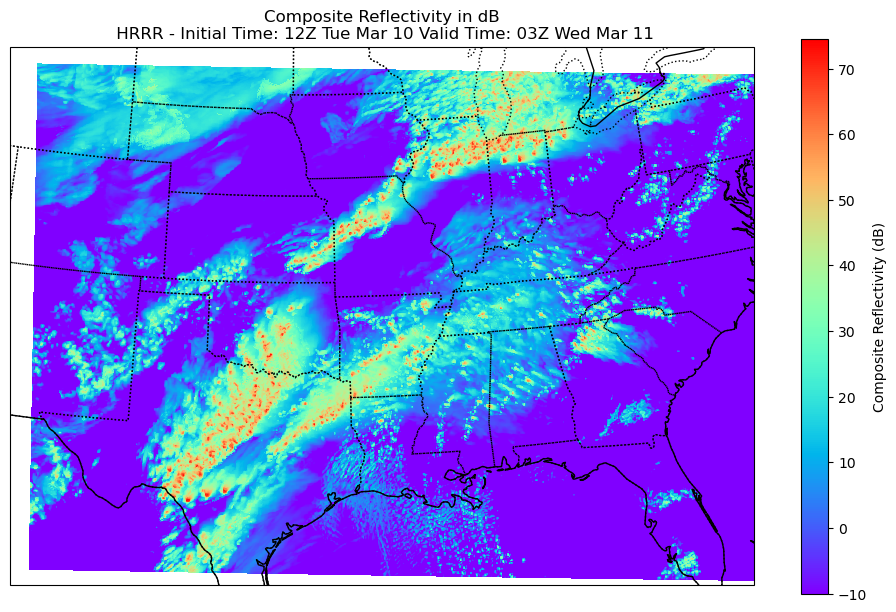

In [7]:
#Plot 4: Composite Reflectivity worked on by Myles

fig,ax=map() #printing our the base map function we created above
pcolor2 = ax.pcolormesh(lon, lat, refc_5hr_rolling.isel(valid_time=15), cmap = 'rainbow', transform = dataproj) #creating the pcolor mesh with the valid_time of 15 with the color map of rainbow and adding longitude and latitude.
plt.colorbar(pcolor2, ax=ax, label = 'Composite Reflectivity (dB)', shrink = 0.8) #creating a colorbar for our map and shrinking it to a respectable size
ax.set_title(f"Composite Reflectivity in dB\n HRRR - Initial Time: {pd.to_datetime(ds_file['valid_time'].isel(valid_time=0).values):%HZ %a %b %d} Valid Time: {pd.to_datetime(ds_file['valid_time'].isel(valid_time=15).values):%HZ %a %b %d}") #setting our title with the model type, initial time, valid time, and what it is plotting
plt.show() #plotting our map

# Index Design Ideas

Worked on by Manuel, Jonathan, and Myles.

-  What the output range will be (e.g., 0–5, 0–100)?

The output range will be 0-5 based on the severity of each parameter.

We will use an elaborate string of if-else statements, creating certain numerical thresholds for each parameter that will dictate the output range of 0-5. We’ll use the “and” and “or” functions in order to create the conditions necessary for a certain number, based on the weighting of each condition. 
  
  
- How each variable might be weighted or influence the result

Variables: CAPE: 255-0 mb above surface, Vertically Integrated Liquid, Vertical Velocity (Geometric), Composite Reflectivity, derived parameter: Vertically Integrated Liquid Density. Planning on weighting vertically integrated liquid heavily, due to strong correlation between it and significant hail. 



# Enhancements to Visualization

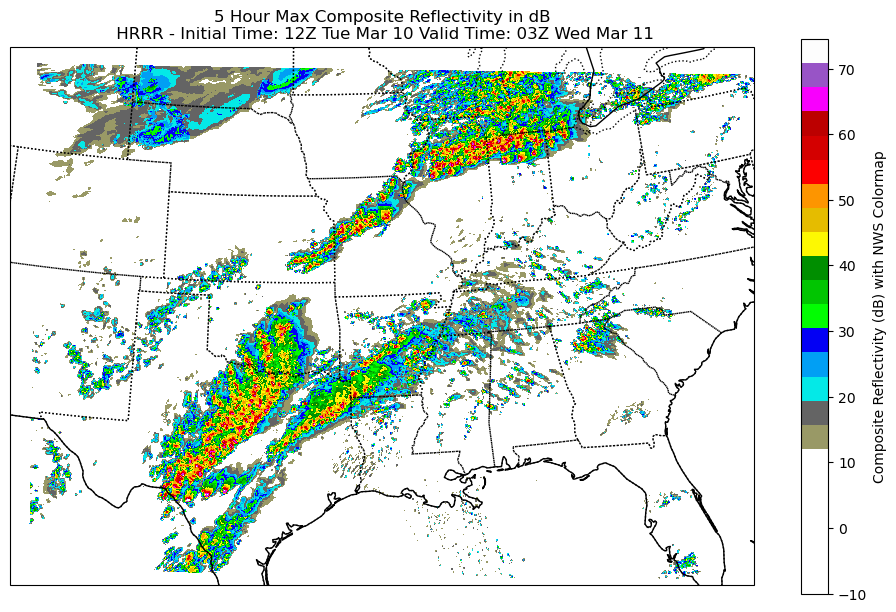

In [8]:
# Custom Colormap of Composite Reflectivity worked on by Jonathan
from matplotlib.colors import ListedColormap #Importing module to use to generate custom colormap

# Similar colopmap found on notebook.community, using the NWS's color scheme for composite reflectivity. We made some edits to the colormap to enhance visual appearance. 
nws_reflectivity_colors = [ 
    "#FFFFFF", # ND
    "#FFFFFF", # -30
    "#FFFFFF", # -25
    "#FFFFFF", # -20
    "#FFFFFF", # -15
    "#FFFFFF", # -10
    "#999966", # -5
    "#646464", # 0
    "#04e9e7", # 5
    "#019ff4", # 10
    "#0300f4", # 15
    "#02fd02", # 20
    "#01c501", # 25
    "#008e00", # 30
    "#fdf802", # 35
    "#e5bc00", # 40
    "#fd9500", # 45
    "#fd0000", # 50
    "#d40000", # 55
    "#bc0000", # 60
    "#f800fd", # 65
    "#9854c6", # 70
    "#fdfdfd" # 75
    ]

# Converting the colormap to a usable object to plot
nws_cmap = ListedColormap(nws_reflectivity_colors, name='nws_reflectivity_colors')

fig,ax=map() # Calling and printing the base map function created above

# Creating a colormesh plot of 5-hour max composite reflectivity liquid plotted on longitude and latitude, valid at 03Z, using the custom colormap
custom_colormap = ax.pcolormesh(ds_file.longitude, ds_file.latitude, refc_5hr_rolling.isel(valid_time=15), cmap = nws_cmap, transform = ccrs.PlateCarree()) 
# Creating a vertically oriented colorbar of 5-hour max composite reflectivity, using the custom colormap
plt.colorbar(custom_colormap, ax=ax, label = 'Composite Reflectivity (dB) with NWS Colormap', shrink = 0.8) #creating a colorbar for our map and shrinking it to a respectable size
# Creating title containing information about content, initial time, and valid time of the plot
ax.set_title(f"5 Hour Max Composite Reflectivity in dB\n HRRR - Initial Time: {pd.to_datetime(ds_file['valid_time'].isel(valid_time=0).values):%HZ %a %b %d} Valid Time: {pd.to_datetime(ds_file['valid_time'].isel(valid_time=15).values):%HZ %a %b %d}") #setting our title with the model type, initial time, valid time, and what it is plotting
plt.show() # Display the map

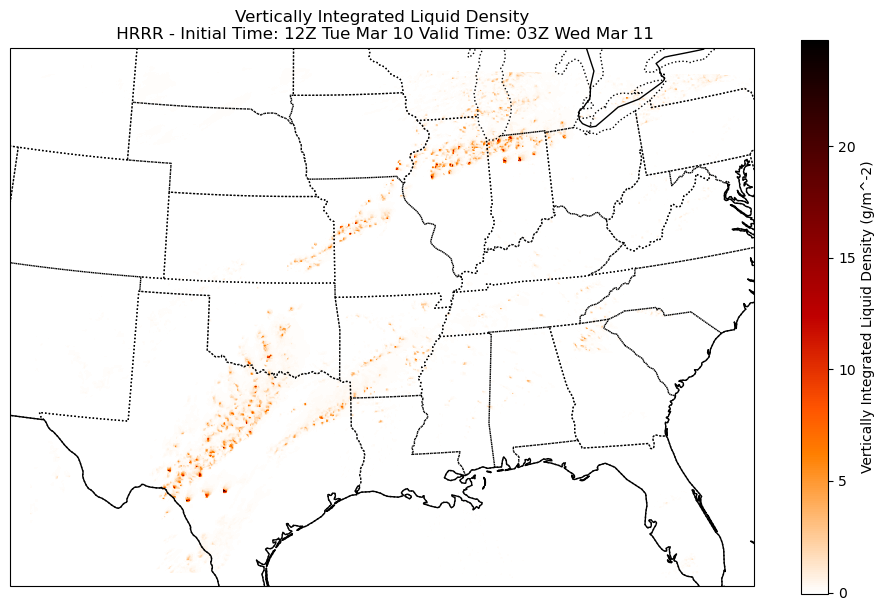

In [9]:
#Derived Parameter Plot worked on by Manuel

#derived products creation
ds_file = ds_file.rename({"unknown":"cloudtop"}) #renaming an unknown variable to cloudtop in order to workaround a naming issue with the cloudtop variable
vil_density =  (ds_file["veril"] /  ds_file["cloudtop"]) *1000 #calculating vertically integrated liquid density
vil_density_5hr_rolling = vil_density.rolling(valid_time=5).max()

fig, ax = map() #printing out the base map funtion we created above
pcolor = ax.pcolormesh(lon, lat, vil_density_5hr_rolling.isel(valid_time=15), cmap = 'gist_heat_r', transform =ccrs.PlateCarree()) #creating the pcolor mesh with the valid_time of 15 with the color map of gist heat in reverse and adding longitude and latitude.
plt.colorbar(pcolor, ax=ax, label = 'Vertically Integrated Liquid Density (g/m^-2)', shrink = 0.8) #creating a colorbar for our map and shrinking it to a respectable size
ax.set_title(f"Vertically Integrated Liquid Density\n HRRR - Initial Time: {pd.to_datetime(ds_file['valid_time'].isel(valid_time=0).values):%HZ %a %b %d} Valid Time: {pd.to_datetime(ds_file['valid_time'].isel(valid_time=15).values):%HZ %a %b %d}") #setting our title with the model type, initial time, valid time, and what it is plotting
plt.show() # Display the map
